# K-Means Exploration

I will use K-means clustering to see if I can automate segmenting new ground truths. K-means is a popular unsupervised clustering method. It is a good all purpose general tool but it may not work too well with werid shapes and I would need to specify the number of clusters I am looking for which will vary for different images.

## Setup 

In [16]:
import numpy as np 

import matplotlib.pyplot as plt
import os
import re
import cv2
from scipy.misc import imresize
from u_net_functions import dice_coef, dice_coef_loss, jacc_coef, jacc_coef_loss, jacc_coef_int, get_unet
from resnet_functions import fcn_model
from sklearn.cluster import KMeans

import tensorflow as tf
print(tf.__version__)

%matplotlib inline

1.2.0


In [22]:
#Loading U-net and ResNet models
model = get_unet()
model.load_weights('unet_checkpoints_1/weights.78-0.13961.hdf5')
#model.load_weights('unet_checkpoints_1/weights.78-0.05982.hdf5')
init_center = np.array([[ 58,  79,  41],
                       [ 77,  77,  54],
                       [ 73,  96,  53],
                       [ 50,  68,  36],
                       [ 65,  87,  47],
                       [ 40,  56,  29],
                       [ 71,  73,  50],
                       [ 87, 101,  64]], dtype='uint8')
#model_resnet = fcn_model()
#model_resnet.load_weights('/media/mlt/Passport 2TB/Morgan\'s Files/Satellite_Roads_Segmentation/checkpoints/weights.20-0.06899.hdf5')

In [23]:
#Helper functions
def invert(img):
    return (1-img)
def resize(img, new_shape):
    img_resized = np.zeros(new_shape+(img.shape[2],)).astype('float32')
    for i in range(img.shape[2]):
        img_resized[:, :, i] = imresize(img[:, :, i], new_shape, interp='bicubic')
    return img_resized

def scale_bands(img, lower_pct = 1, upper_pct = 99):
    """
    Rescale the bands of a multichannel image for display
    """
    # Loop through the image bands, rescaling each one
    img_scaled = np.zeros(img.shape, np.uint8)
    
    for i in range(img.shape[2]):
        
        band = img[:, :, i]
        
        # Pick out the lower and upper percentiles
        lower, upper = np.percentile(band, [lower_pct, upper_pct])
        
        # Normalize the band
        band = (band - lower) / (upper - lower) * 255
        
        # Clip the high and low values, and cast to uint8
        img_scaled[:, :, i] = np.clip(band, 0, 255).astype(np.uint8)
        
    return img_scaled

from sklearn.metrics import jaccard_similarity_score
# Function to create an iterator with examples
smooth=1
def jacc_coef_int(y_true, y_pred):
    y_pred_pos = y_pred
    intersection = np.sum(y_true * y_pred_pos)
    sum_ = np.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return np.mean(jac)

def dice_coef(y_true, y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

In [34]:
path = 'training_tiles_1000size/Train'
tiles = [os.path.join(path, image_name) 
           for image_name in os.listdir(path) 
           if image_name.lower().endswith('img.npy')]

# Visual GridSearch 

I took a diverse image and see what kind of clusters I can get for each K, the number of clusters.

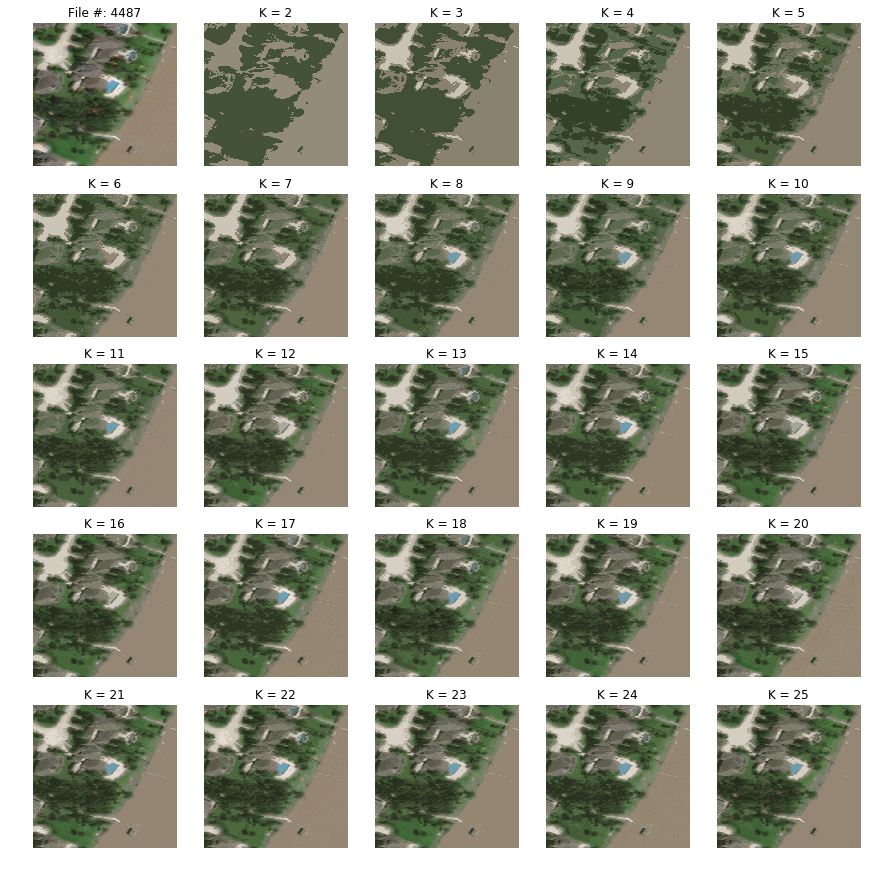

In [6]:
fig = plt.figure(figsize=(20,100))

img = np.load('training_tiles/%d_img.npy'%2046)
ax = fig.add_subplot(5,5,1)
ax.imshow(img)
ax.title.set_text('File #: ' + str(4487))
plt.axis('off')
fig.tight_layout()
plt.subplots_adjust(bottom=0.87)

Z = img.reshape((-1,3))
Z = np.float32(Z)

# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

#Running K means for different K up to 26.
K = 26
for k in range(2,K):
    ret,label,center=cv2.kmeans(Z,k,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)

    # Now convert back into an image
    center = np.uint8(center)
    res = center[label.flatten()]
    res2 = res.reshape((img.shape))

    ax2 = fig.add_subplot(5,5,k)
    ax2.imshow(res2)
    plt.axis('off')
    ax2.title.set_text('K = '+str(k))
    
    fig.tight_layout()
    plt.subplots_adjust(bottom=0.88,right=0.6)

Seems like K=16 is a good start. I would also look at the silhoutte score but sklearn has a poor implementation of it and it runs O(N^2) on memory which I do not have the ram for.

# Plotting Histograms of Clusters 

This just shows the legend of color cluster segments for different K.

In [83]:
import numpy as np
import cv2
from sklearn.cluster import KMeans

def centroid_histogram(clt):
    # grab the number of different clusters and create a histogram
    # based on the number of pixels assigned to each cluster
    numLabels = np.arange(0, len(np.unique(clt.labels_)) + 1)
    (hist, _) = np.histogram(clt.labels_, bins = numLabels)

    # normalize the histogram, such that it sums to one
    hist = hist.astype("float")
    hist /= hist.sum()

    # return the histogram
    return hist

def plot_colors(hist, centroids):
    # initialize the bar chart representing the relative frequency
    # of each of the colors
    bar = np.zeros((50, 300, 3), dtype = "uint8")
    startX = 0

    # loop over the percentage of each cluster and the color of
    # each cluster
    for (percent, color) in zip(hist, centroids):
        # plot the relative percentage of each cluster
        endX = startX + (percent * 300)
        cv2.rectangle(bar, (int(startX), 0), (int(endX), 50),
            color.astype("uint8").tolist(), -1)
        startX = endX

    # return the bar chart
    return bar

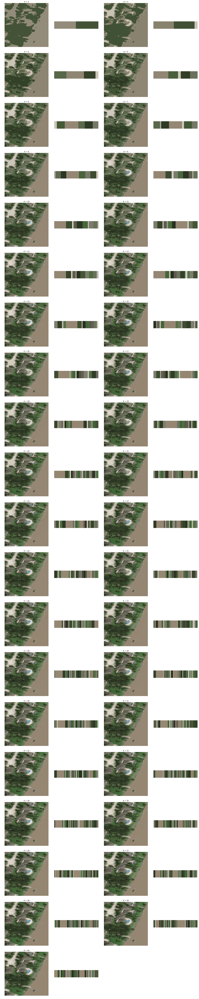

In [84]:
import scipy.misc
img = np.load('training_tiles/%d_img.npy'%2046)
# Reshape the image to be a list of pixels
img_array = img.reshape((img.shape[0] * img.shape[1], 3))
Z = img.reshape((-1,3))
Z = np.float32(Z)
fig = plt.figure(figsize=(20,100))

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
K = 41
i = 1
j = 1
for k in range(2,K):
    if i <= 80:
        # Clusters the pixels
        clt = KMeans(n_clusters = k,n_jobs=8)
        clt.fit(img_array)
        
        #Getting the histogram bar
        hist = centroid_histogram(clt)
        bar = plot_colors(hist, clt.cluster_centers_)
    
        #K means and converting back to image.
        ret,label,center=cv2.kmeans(Z,k,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)
        center = np.uint8(center)
        res = center[label.flatten()]
        res2 = res.reshape((img.shape))

        ax1 = fig.add_subplot(20,4,i)
        ax1.imshow(res2)    
        plt.axis('off')
        ax1.title.set_text('K = '+str(k))

        # show our color bart
        ax2 = fig.add_subplot(20,4,i+1)
        ax2.imshow(bar)
        plt.axis("off")
        
        i+=2
        j+=1

        fig.tight_layout()


# Ranking cluster by jaccard or Dice

I'll try to rank cluster in terms of overlapping with the original ground truth using Jaccard Similarity and Dice.

/home/mlt/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: overflow encountered in ulong_scalars


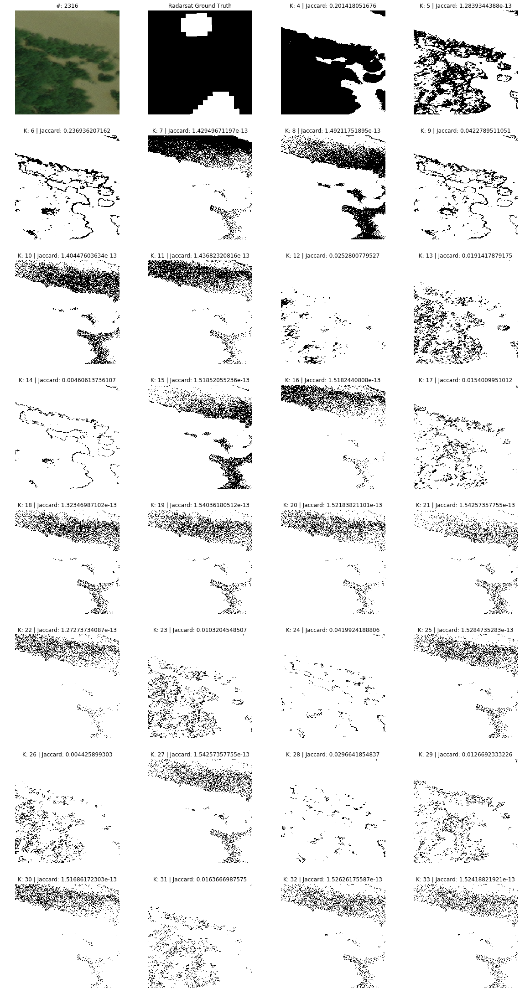

In [66]:
#Load images
random = np.random.choice(tiles, replace=False)
img = (np.load(random) )
Z = img.reshape((-1,3))
Z = np.float32(Z)
mask = np.load(random[:random.find('_img.npy')] + "_mask.npy")

#Plot
fig = plt.figure(figsize=(20,120))
ax1 = fig.add_subplot(24,4,1)
ax2 = fig.add_subplot(24,4,2)
ax1.imshow(img)
ax1.title.set_text('#: ' + str(2316))
ax1.axis("off")
ax2.imshow(mask,cmap=plt.cm.gray)
ax2.title.set_text('Radarsat Ground Truth')
ax2.axis("off")

#Initalize K means
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

#Going from K=3 to K=65
K = 65
i = 3
for k in range(4,K):
    if i <= K-i-1:
        #K means
        ret,label,center=cv2.kmeans(Z,k,None,criteria,10,cv2.KMEANS_PP_CENTERS)
        center = np.uint8(center)
        
        score_list = np.zeros(k)
        mask_list = []
        
        #For reach K, loop through and find the cluster with the most overlap using jaccard and dice
        for cluster in range(0,k):
            test = label.flatten()==cluster
            res = center[:,0][test*1]
            res2 = res.reshape((300,300,))
            mask2 = cv2.normalize(res2, dst = np.zeros(shape=(300,300)),alpha=0,beta=1,norm_type=cv2.NORM_MINMAX)
            if cluster == 0:
                mask2 = invert(mask2)
            mask_list.append(mask2)
            score1= jaccard_similarity_score(mask.astype('uint8'),mask2.astype('uint8')) #Jaccard
            score2 = jacc_coef_int(mask,mask2)
            score3 = dice_coef(mask,mask2) #Dice
            score_list[cluster] = score2

        segment = score_list.argmin()
        mask2 = mask_list[segment]

        ax = fig.add_subplot(24,4,i)
        plt.imshow(mask2, cmap=plt.cm.gray)

        ax.title.set_text('K: '+ str(k) + ' | Jaccard: ' + str(score2))
        ax.axis("off")
        i+=1


It seems unnecessary to go beyond K=8. The range between 4 to 8 seems good. This method heavily rests on the assumption that the Radarsat ground truth only has no false positives which may not be true.

The next few images are the same, where I try to find the best cluster for each K.

### Plotting best clusters for each K 

/home/mlt/anaconda2/lib/python2.7/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family [u'Times New Roman Bold'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


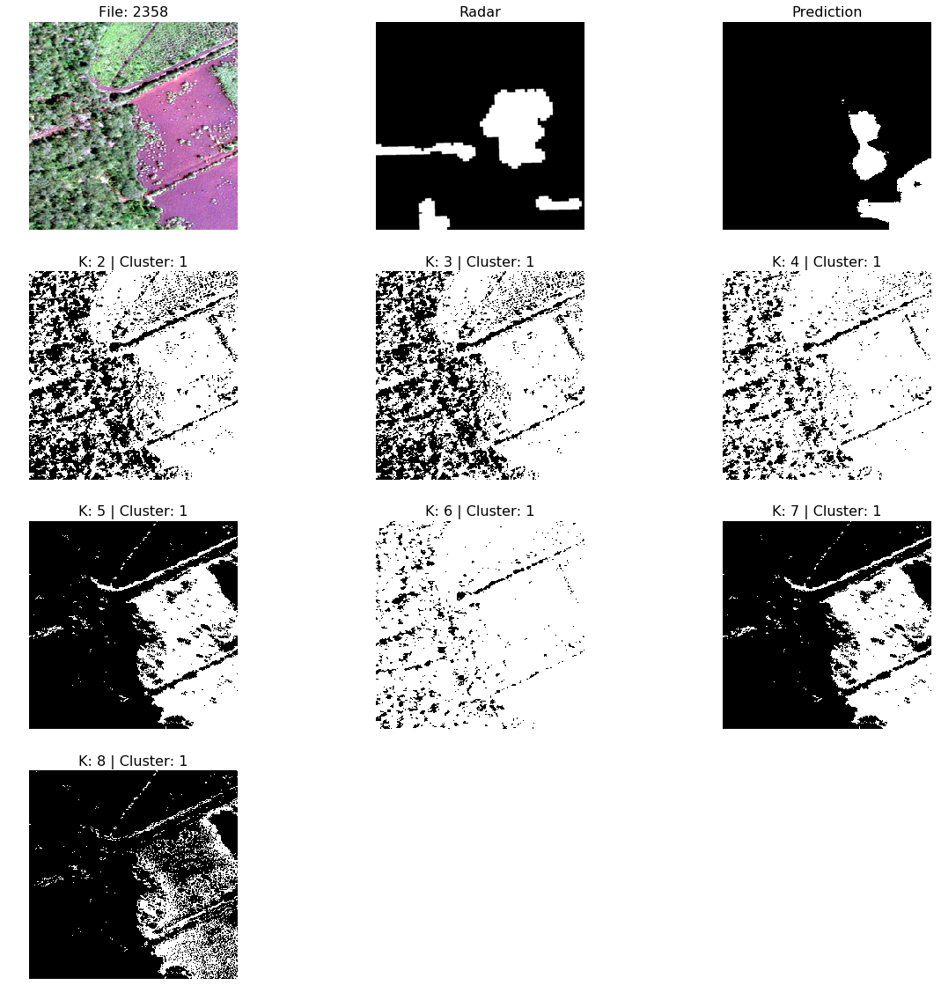

In [4]:
input_size = 256

#Loading and resizing Image
img = np.load('training_tiles_1000size/Train/%d_img.npy'%5241) 
img = resize(img, (input_size, input_size))
X = img.astype('float32')
X = (X / X.max() - 0.5) * 2
Z = img.reshape((-1,3))
Z = np.float32(Z)

#Loading and resizing Radar Ground Truth Masks
mask = np.load('training_tiles_1000size/Train/%d_mask.npy'%4146)
Y = imresize(mask, (input_size, input_size))
Y = Y.astype('float32') / 255

#Runing predictions with U-Net
predict_unet = model.predict(X[None, ...])[0, ...] > 0.15
predict_unet = predict_unet * 1
predict_unet = predict_unet[:, :, 0]

#Plotting the three items above
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(4,3,1)
ax1.imshow(scale_bands(img))
ax1.set_title('File: '+str(2358),fontsize= 16,fontname="Times New Roman Bold")
ax1.axis('off')
ax2 = fig.add_subplot(4,3,2)
ax2.imshow(Y, cmap=plt.cm.gray)
ax2.set_title('Radar',fontsize= 16,fontname="Times New Roman Bold")
ax2.axis('off')
ax3 = fig.add_subplot(4,3,3)
ax3.imshow(predict_unet, cmap=plt.cm.gray)
ax3.set_title('Prediction',fontsize= 16,fontname="Times New Roman Bold")
ax3.axis('off')

i = 4
K = 9
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
for k in range(2,K):
    ret,label,center=cv2.kmeans(Z,k,None,criteria,10,cv2.KMEANS_PP_CENTERS)
    center = np.uint8(center)
    
    segment_list = []
    intersect_list = []
    
    for cluster in range(0,k):
        label_mask = label.flatten()==cluster
        res = center[:,0][label_mask*1]
        res2 = res.reshape((input_size,input_size,))
        segment = cv2.normalize(res2,dst=np.zeros(shape=(input_size,input_size)),alpha=0,beta=1,norm_type=cv2.NORM_MINMAX)
        #if cluster == 0:
        #    segment = invert(segment)
        segment_list.append(segment)

        intersection = np.sum(predict_unet.astype('float32').flatten() * segment.astype('float32').flatten())
        intersect_list.append(intersection)
    
    index = np.argmax(intersect_list)   
    cluster_mask = segment_list[index]
    
    ax = fig.add_subplot(4,3,i)
    ax.imshow(cluster_mask, cmap=plt.cm.gray)
    ax.set_title('K: '+ str(k) + ' | Cluster: ' + str(index),fontsize= 16)
    #ax.set_title('K = '+ str(k),fontsize= 16)
    ax.axis('off')
    i+=1    

## Plotting the best K cluster

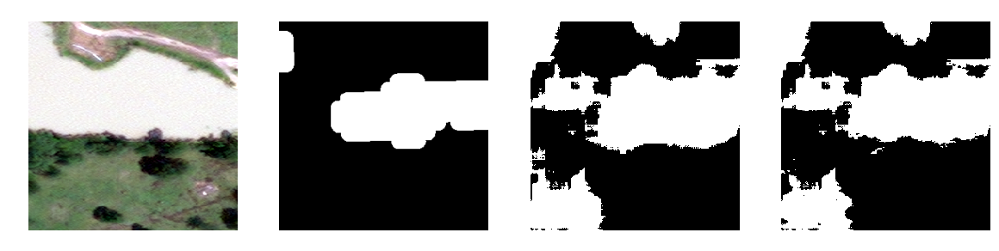

In [13]:
input_size = 256

#Loading and resizing Image
img = np.load('training_tiles/%d_img.npy'%2358) 
img = resize(img, (input_size, input_size))
X = img.astype('float32')
X = (X / X.max() - 0.5) * 2
Z = img.reshape((-1,3))
Z = np.float32(Z)

#Loading and resizing Radar Ground Truth Masks
mask = np.load('training_tiles/%d_mask.npy'%2358)
Y = imresize(mask, (input_size, input_size))
Y = Y.astype('float32') / 255

#Runing predictions with U-Net
predict_unet = model.predict(X[None, ...])[0, ...] > 0.15
predict_unet = predict_unet * 1
predict_unet = predict_unet[:, :, 0]

#Plotting the three items above
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(1,4,1)
ax1.imshow(scale_bands(img))
ax1.set_title('File: '+str(2358),fontsize= 16,fontname="Times New Roman Bold",color='w')
ax1.axis('off')
ax2 = fig.add_subplot(1,4,2)
ax2.imshow(Y, cmap=plt.cm.gray)
ax2.set_title('Radar',fontsize= 16,fontname="Times New Roman Bold",color='w')
ax2.axis('off')
ax3 = fig.add_subplot(1,4,3)
ax3.imshow(predict_unet, cmap=plt.cm.gray)
ax3.set_title('Prediction',fontsize= 16,fontname="Times New Roman Bold",color='w')
ax3.axis('off')

K_intersect = dict()
K_segment = dict()
K_overlap = dict()
i = 4
K = 5
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
for k in range(2,K):
    ret,label,center=cv2.kmeans(Z,k,None,criteria,10,cv2.KMEANS_PP_CENTERS)
    center = np.uint8(center)
    
    segment_list = []
    total_intersect_list = []
    overlap_list = []
    
    for cluster in range(0,k):
        label_mask = label.flatten()==cluster
        res = center[:,0][label_mask*1]
        res2 = res.reshape((input_size,input_size,))
        segment = cv2.normalize(res2,dst=np.zeros(shape=(input_size,input_size)),alpha=0,beta=1,norm_type=cv2.NORM_MINMAX)
        #if cluster == 0:
        #    segment = invert(segment)
        segment_list.append(segment)

        intersection = np.sum(predict_unet.astype('float32').flatten() * segment.astype('float32').flatten())
        total_intersect_list.append(intersection)
        overlap_list.append((predict_unet.astype('float32').flatten()*segment.astype('float32').flatten()).reshape((input_size,input_size,)))
        
    index = np.argmax(total_intersect_list)   
    cluster_mask = segment_list[index]
    overlap_mask = overlap_list[index]
    
    K_intersect[k] = max(total_intersect_list)
    K_segment[k] = cluster_mask
    K_overlap[k] = overlap_mask

best_K = max(K_intersect, key=K_intersect.get)
new_cluster_mask = (K_overlap[best_K]).astype('uint8') 
    
ax = fig.add_subplot(1,4,i)
ax.imshow(new_cluster_mask, cmap=plt.cm.gray)
ax.set_title('K: '+ str(best_K) + ' | Intersection #: ' + str(K_intersect[best_K]),fontsize= 16,color='w')
#ax.set_title('K = '+ str(k),fontsize= 16)
ax.axis('off')
i+=1    

# Improve Ground Truth or Prediction with K Means

Here are some brainstorms:

For each Image:
    Load and plot image
        
    Load and plot radar ground truth mask
        
    Predict with U-net
        
    Plot Prediction
        
    For each K:
    
        Run K-means clustering
        
        For each cluster:
            Get the cluster mask
            Get intersection with prediction  #and ground truth mask
            Append to a list
        
        Get the cluster with the most intersection
        
        Plot that cluster mask

        Record the cluster with the most intersection
        
    Find the K with the most intersection of top cluster
    Plot that K's cluster mask

        Get the cluster with the most intersection for each
        Keep only cluster both agreed on   

## Intersect with Prediction + RadarSAT

I can either take the clusters that both prediction and radarsat ground truth agree on, then either intersect with both or the one with the most overlap.

In [6]:
import pickle
with open('X_val.pkl','rb') as f:
    X_val = pickle.load(f)
with open('Y_val.pkl','rb') as f:
    Y_val = pickle.load(f)
    
dir_path = 'training_tiles_1000size/Validation'
np_files = [os.path.join(path,f[:f.find('_img.npy')])
             for path,_,files in os.walk(dir_path) 
             for f in files if (f.endswith('img.npy'))]

num = 20
random_tiles = np.random.choice(np_files,num,replace=False)

/home/mlt/anaconda2/lib/python2.7/site-packages/sklearn/cluster/k_means_.py:889: RuntimeWarning: Explicit initial center position passed: performing only one init in k-means instead of n_init=10
  return_n_iter=True)


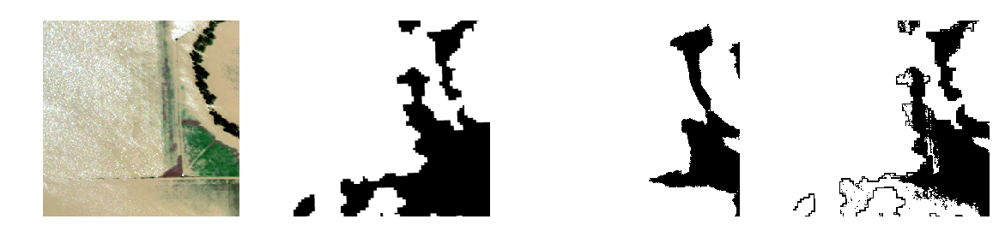

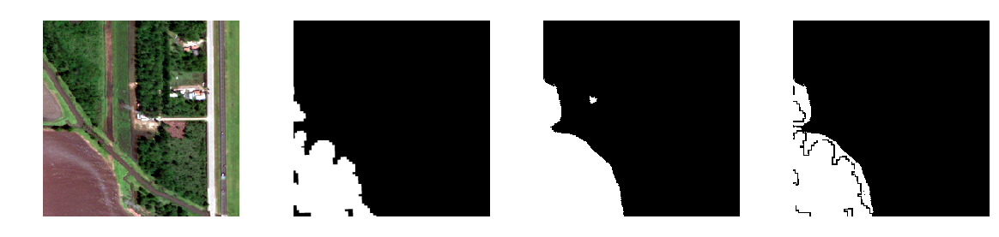

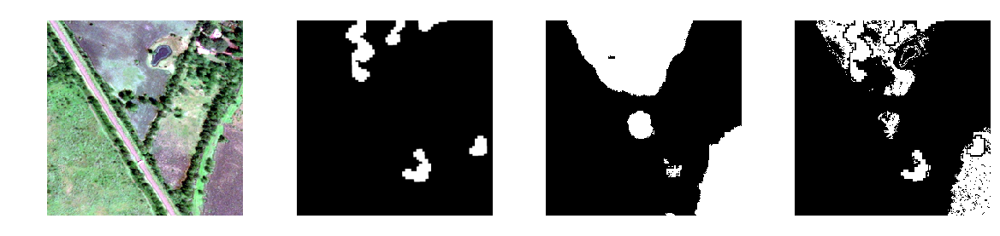

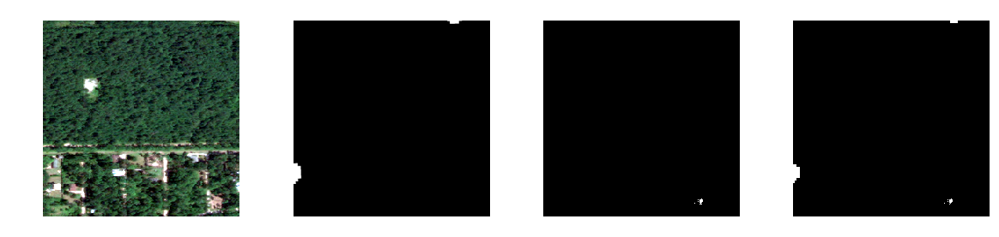

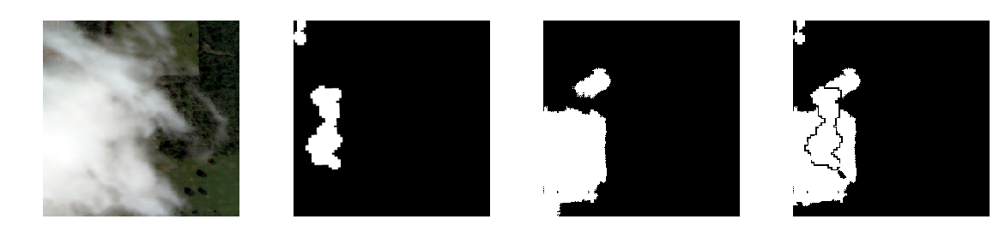

...

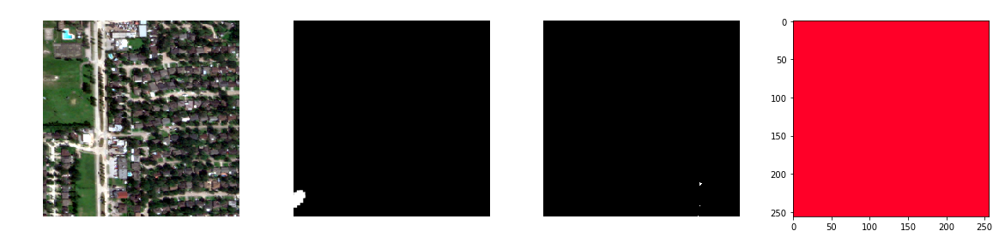

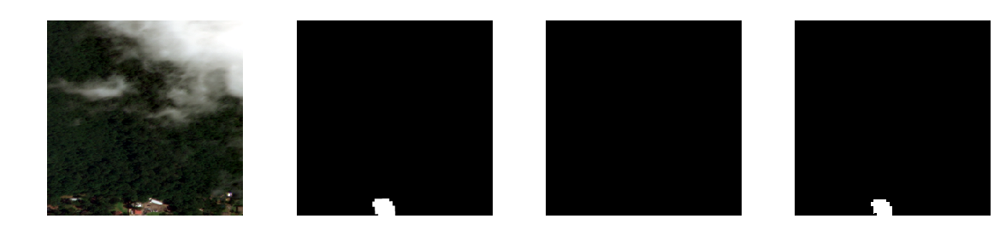

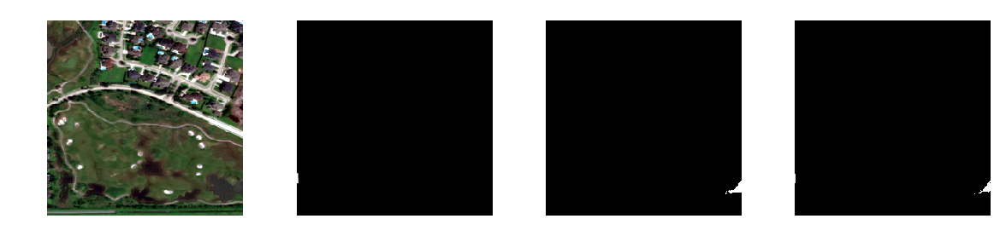

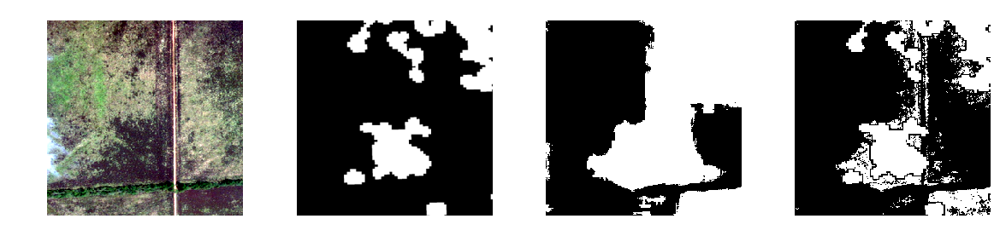

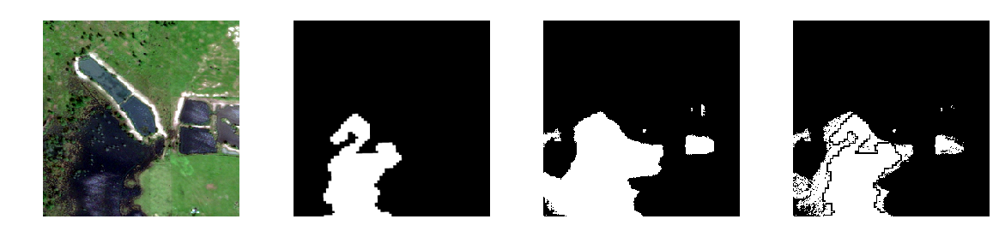

In [9]:
 for tile_no in random_tiles:
    input_size = 256
    
    #Loading and resizing Image
    img = np.load(tile_no+'_img.npy') 
    img = resize(img, (input_size, input_size))
    X = img.astype('float32')
    X = (X / X.max() - 0.5) * 2
    Z = img.reshape((-1,3))
    Z = np.float32(Z)

    #Loading and resizing Radar Ground Truth Masks
    mask = np.load(tile_no+'_mask.npy')
    Y = imresize(mask, (input_size, input_size))
    Y = Y.astype('float32') / 255

    #Runing predictions with U-Net
    predict_unet = model.predict(X[None, ...])[0, ...] > 0.15
    predict_unet = predict_unet * 1
    predict_unet = predict_unet[:, :, 0]

    #Plotting the three items above
    fig = plt.figure(figsize=(20,num/4*20))
    ax1 = fig.add_subplot(num,4,1)
    ax1.imshow(scale_bands(img[:, :, :]))
    ax1.set_title('File: '+str(tile_no),fontsize= 16,fontname="Times New Roman Bold",color='w')
    ax1.axis('off')
    ax2 = fig.add_subplot(num,4,2)
    ax2.imshow(Y, cmap=plt.cm.gray)
    ax2.set_title('RADARSAT',fontsize= 16,fontname="Times New Roman Bold",color='w')
    ax2.axis('off')
    ax3 = fig.add_subplot(num,4,3)
    ax3.imshow(predict_unet, vmin=0,vmax=1,cmap=plt.cm.gray)
    ax3.set_title('Prediction',fontsize= 16,fontname="Times New Roman Bold",color='w')
    ax3.axis('off')

    K_intersect_P = dict()
    K_intersect_R = dict()
    K_segment = dict()
    K_overlap = dict()
    i = 4
    K = 8
    for k in range(4,K):
        kmeans = KMeans(n_clusters=k, n_jobs=-1,init=init_center[:k]).fit(Z)
        label = kmeans.labels_
        center = kmeans.cluster_centers_
        center = np.uint8(center)

        segment_list = []
        total_intersect_list_P = []
        overlap_list = []
        
        total_intersect_list_R = []

        for cluster in range(0,k):
            label_mask = label.flatten()==cluster
            res = center[:,0][label_mask*1]
            res2 = res.reshape((input_size,input_size,))
            segment = cv2.normalize(res2,dst=np.zeros(shape=(input_size,input_size)),alpha=0,beta=1,norm_type=cv2.NORM_MINMAX)
            #if cluster == 0:
            #    segment = invert(segment)
            segment_list.append(segment)

            intersection = np.sum(predict_unet.flatten() * segment.flatten()) #Intersect of prediction and cluster
            total_intersect_list_P.append(intersection) 
            overlap_list.append((predict_unet.flatten()*segment.flatten()).reshape((input_size,input_size,))) 
            
            intersection = np.sum(Y.flatten() * segment.flatten())
            total_intersect_list_R.append(intersection)

        index_P = np.argmax(total_intersect_list_P) #Index of intersections from prediction 
        index_R = np.argmax(total_intersect_list_R) #Index of intersections from radarsat
        cluster_mask = segment_list[index_P] #Just cluster mask
        overlap_mask = overlap_list[index_P] #Intersection of cluster and prediction
        
        if index_P == index_R:
            K_intersect_P[k] = max(total_intersect_list_P)
            K_intersect_R[k] = max(total_intersect_list_R)
            K_segment[k] = cluster_mask
            K_overlap[k] = overlap_mask 
            
    if len(K_intersect_P) > 0:
        best_K = max(K_intersect_R, key=K_intersect_R.get)
        #Intersect wiht prediction and union with RADARSAT
        ax = fig.add_subplot(num,4,i)
        ax.imshow(new_cluster_mask, cmap=plt.cm.gray)
        ax.set_title('K: '+ str(best_K) + ' | Intersection #: ' + str(K_intersect_R[best_K]),fontsize= 16,color='w')
        ax.axis('off')
           
    else:
        new_cluster_mask = np.ones(shape=(input_size,input_size))
        ax = fig.add_subplot(num,4,i)
        ax.imshow(new_cluster_mask,cmap='gist_rainbow')
        ax.set_title('Remove',fontsize= 16,color='w')
    i+=1 

It seems to work alright sometimes, but it definitely needs some gaussian smoothing.

## Overlap with just the GT, no intersection

Here, I only find clusters that overlap with the radarsat ground truth and generate a mask by getting their union.

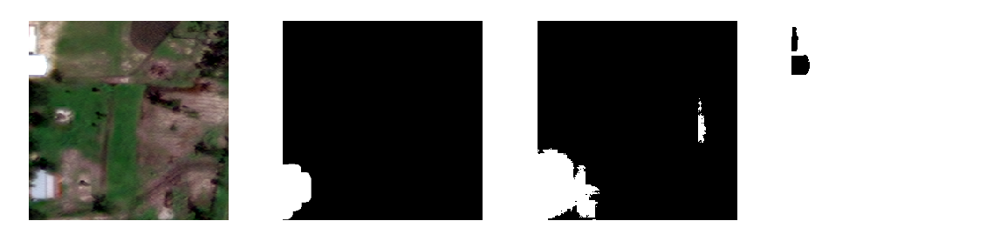

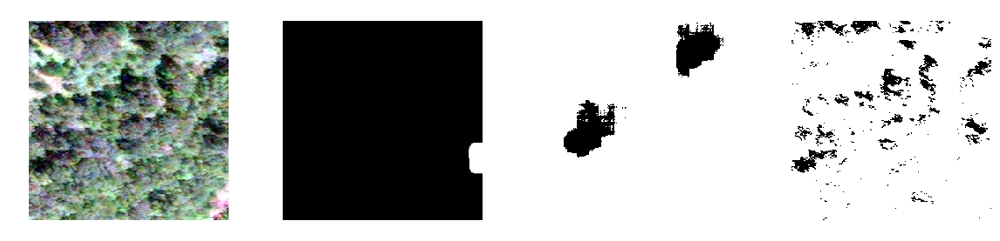

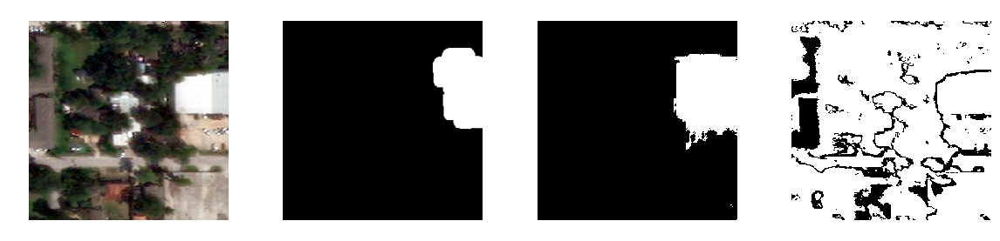

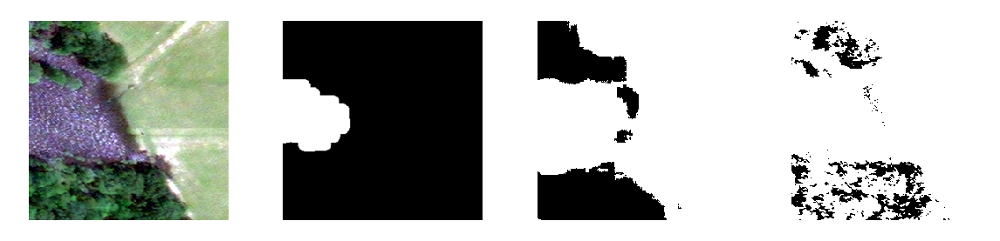

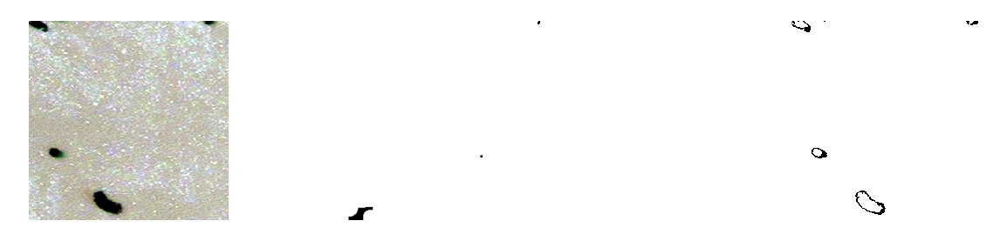

...

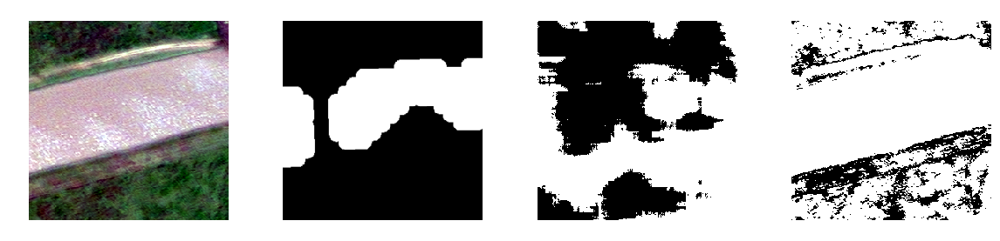

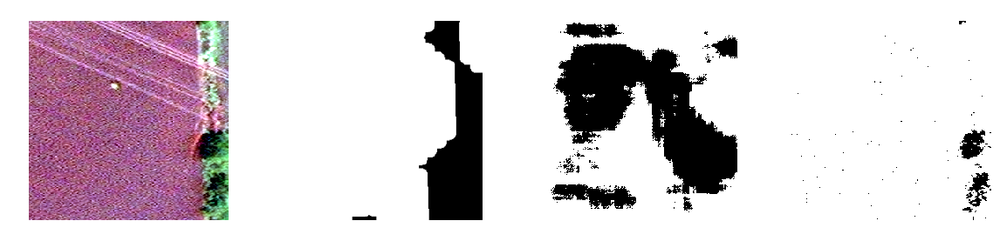

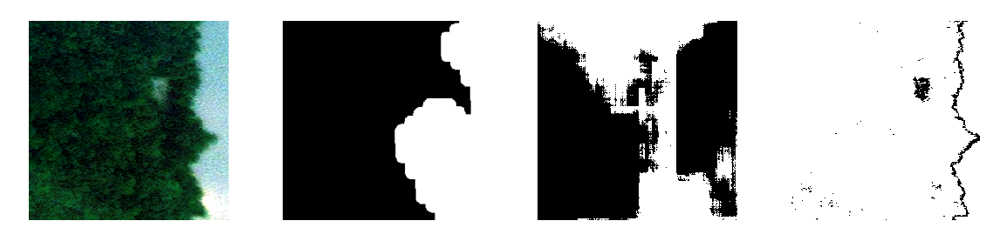

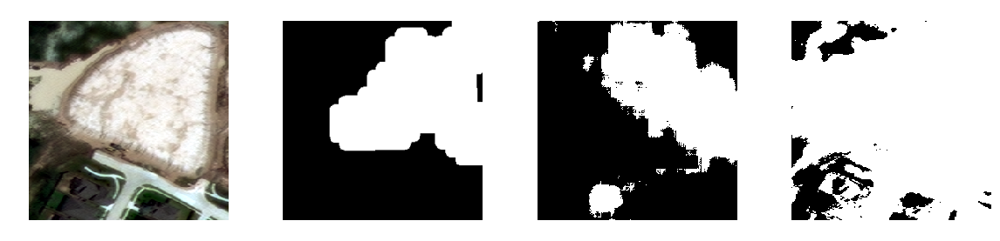

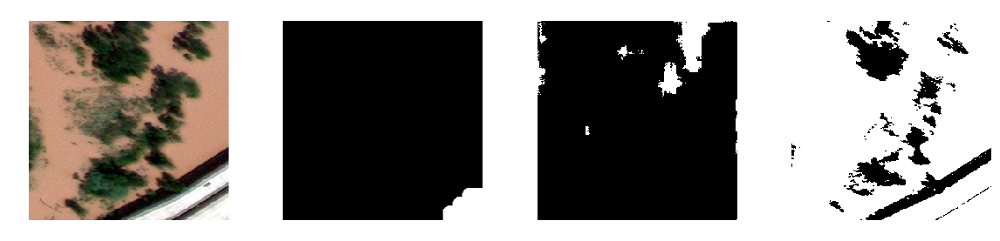

In [76]:
num = 20
tiles_list = [1828, 4952, 3140, 2073, 550, 5543, 2521, 2588, 2248, 5299, 6582, 2414, 3111, 619, 4135, 6338, 1989, 678, 5839, 5546, 3908]
random_tiles = np.random.choice(tiles_list,num,replace=False)

for tile_no in random_tiles:
    input_size = 256
    
    #Loading and resizing Image
    img = np.load('training_tiles/%d_img.npy'%tile_no) 
    img = resize(img, (input_size, input_size))
    X = img.astype('float32')
    X = (X / X.max() - 0.5) * 2
    Z = img.reshape((-1,3))
    Z = np.float32(Z)

    #Loading and resizing Radar Ground Truth Masks
    mask = np.load('training_tiles/%d_mask.npy'%tile_no)
    Y = imresize(mask, (input_size, input_size))
    Y = Y.astype('float32') / 255

    #Runing predictions with U-Net
    predict_unet = model.predict(X[None, ...])[0, ...] > 0.15
    predict_unet = predict_unet * 1
    predict_unet = predict_unet[:, :, 0]

    #Plotting the three items above
    fig = plt.figure(figsize=(20,num/4*20))
    ax1 = fig.add_subplot(num,4,1)
    ax1.imshow(scale_bands(img[:, :, :]))
    ax1.set_title('File: '+str(2358),fontsize= 16,fontname="Times New Roman Bold",color='w')
    ax1.axis('off')
    ax2 = fig.add_subplot(num,4,2)
    ax2.imshow(Y, cmap=plt.cm.gray)
    ax2.set_title('RADARSAT',fontsize= 16,fontname="Times New Roman Bold",color='w')
    ax2.axis('off')
    ax3 = fig.add_subplot(num,4,3)
    ax3.imshow(predict_unet, cmap=plt.cm.gray)
    ax3.set_title('Prediction',fontsize= 16,fontname="Times New Roman Bold",color='w')
    ax3.axis('off')

    K_intersect = dict()
    K_segment = dict()
    K_overlap = dict()
    i = 4
    K = 8
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    for k in range(5,K):
        ret,label,center=cv2.kmeans(Z,k,None,criteria,10,cv2.KMEANS_PP_CENTERS)
        center = np.uint8(center)

        segment_list = []
        total_intersect_list = []
        overlap_list = []

        for cluster in range(0,k):
            label_mask = label.flatten()==cluster
            res = center[:,0][label_mask*1]
            res2 = res.reshape((input_size,input_size,))
            segment = cv2.normalize(res2,dst=np.zeros(shape=(input_size,input_size)),alpha=0,beta=1,norm_type=cv2.NORM_MINMAX)
            if cluster == 0:
                segment = invert(segment)
            segment_list.append(segment)
            
            intersection = np.sum(Y.flatten() * segment.flatten())
            total_intersect_list.append(intersection)
            overlap_list.append((Y.flatten()*segment.flatten()).reshape((input_size,input_size,)))

        index = np.argmax(total_intersect_list)   
        cluster_mask = segment_list[index]
        overlap_mask = overlap_list[index]
        
        K_intersect[k] = max(total_intersect_list)
        K_segment[k] = cluster_mask
        K_overlap[k] = overlap_mask

    #Rank clusters with best intersects
    best_K = max(K_intersect, key=K_intersect.get)
    new_cluster_mask = (K_segment[best_K]).astype('uint8')

    ax = fig.add_subplot(num,4,i)
    ax.imshow(new_cluster_mask, cmap=plt.cm.gray)
    ax.set_title('K: '+ str(best_K) + ' | Intersection #: ' + str(K_intersect[best_K]),fontsize= 16,color='w')
    #ax.set_title('K = '+ str(k),fontsize= 16)
    ax.axis('off')
    i+=1    

I decided to go with the intersection with prediction and union with radarsat, naively assumping the radarsat won't have false positives.